<a href="https://colab.research.google.com/github/yuan-code/Movie_Recommendation_Engine_Development_in_Apache_Spark/blob/main/Spark_on_GCP_For_Movie_Recommendation_System.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Movie Recommendation System via Apache Spark
In this project, I built a simple movie recommendation engine using Alternating Least Squares (ALS) algorithm in collaborative filtering with Spark ML on [MovieLens movie rating dataset](https://grouplens.org/datasets/movielens/latest/). The idea behind collaborative filtering is that if rating data from many users on many movies is available, a user’s ratings can be predicted for the movies not watched yet, then giving some recommendations. We can also find some similar movies for a given movie. We also use [The Movie Database (TMdb) API](https://www.themoviedb.org/documentation/api) to dislay recommended movie posters to the user.

This dataset contains metadata for 27,000,000 ratings and 1,100,000 tag applications applied to 58,000 movies by 280,000 users listed in the Full MovieLens Dataset last updated on Sep 2018. Includes tag genome data with 14 million relevance scores across 1,100 tags.

Let’s have a look at a sample of small dataset with about 100,000 ratings, 9,000 movies and 600 users to start with. There are four separate datasets.

Movies data file contains: movieId, title, genres

ratings data file contains: userId, movieId, rating, timestamp

tags data file contains: userId, movieId, tag, timestamp

Links data file contains: movieId, imdbId, tmdbId

# Contents
* Part 0: Spark Setup & Import Data
* Part 1: Data ETL and OLAP
* Part 2: Spark ALS based approach for training model
* Part 3: Give recommendations based on the recommendation system
  * Part 3.1: Recommend moives to users with given id
  * Part 3.2: Find the similar movies for movie with given id
* Part 4: Add new user and recommend movies for the new user
* Conclusion

# Spark Setup

In [ ]:
!apt-get install openjdk-8-jdk-headless -qq > /dev/null
!wget -q https://apache.osuosl.org/spark/spark-3.1.2/spark-3.1.2-bin-hadoop3.2.tgz
!tar xf spark-3.1.2-bin-hadoop3.2.tgz

In [ ]:
# Set up Spark
!pip install -q findspark
!pip install py4j

!export JAVA_HOME=$(/usr/lib/jvm/java-8-openjdk-amd64 -v 1.8)
! echo $JAVA_HOME
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.1.2-bin-hadoop3.2"
import findspark
findspark.init("spark-3.1.2-bin-hadoop3.2")# SPARK_HOME

from pyspark.sql import SparkSession
spark = SparkSession.builder.master("local[*]").getOrCreate()

     |████████████████████████████████| 198 kB 3.2 MB/s 
/bin/bash: /usr/lib/jvm/java-8-openjdk-amd64: Is a directory



In [ ]:
!ls

sample_data  spark-3.1.2-bin-hadoop3.2	spark-3.1.2-bin-hadoop3.2.tgz


In [ ]:
spark.version

'3.1.2'

# Spark Project for MoiveLens Data Analysis

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
import os
os.environ["PYSPARK_PYTHON"] = "python3"

from pyspark.sql.functions import udf, min, avg, max
from pyspark.sql.types import *
import re

In [ ]:
# !wget http://files.grouplens.org/datasets/movielens/ml-latest.zip
# !unzip ml-latest.zip

!wget https://files.grouplens.org/datasets/movielens/ml-latest-small.zip
!unzip ml-latest-small.zip

--2022-03-11 18:22:21--  https://files.grouplens.org/datasets/movielens/ml-latest-small.zip
Resolving files.grouplens.org (files.grouplens.org)... 128.101.65.152
Connecting to files.grouplens.org (files.grouplens.org)|128.101.65.152|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 978202 (955K) [application/zip]
Saving to: ‘ml-latest-small.zip’

ml-latest-small.zip 100%[===================>] 955.28K  4.61MB/s    in 0.2s    

2022-03-11 18:22:22 (4.61 MB/s) - ‘ml-latest-small.zip’ saved [978202/978202]

Archive:  ml-latest-small.zip
   creating: ml-latest-small/
  inflating: ml-latest-small/links.csv  
  inflating: ml-latest-small/tags.csv  
  inflating: ml-latest-small/ratings.csv  
  inflating: ml-latest-small/README.txt  
  inflating: ml-latest-small/movies.csv  


In [ ]:
!ls ml-latest-small/

links.csv  movies.csv  ratings.csv  README.txt	tags.csv


In [ ]:
# ratings_df = spark.read.csv('./ml-latest/ratings.csv',inferSchema=True, header =True)
# movies_df = spark.read.csv('./ml-latest/movies.csv',inferSchema=True, header =True)
# links_df = spark.read.csv('./ml-latest/links.csv',inferSchema=True, header =True)
# tags_df = spark.read.csv('./ml-latest/tags.csv',inferSchema=True, header =True)

ratings_df = spark.read.csv('./ml-latest-small/ratings.csv',inferSchema=True, header =True)
movies_df = spark.read.csv('./ml-latest-small/movies.csv',inferSchema=True, header =True)
links_df = spark.read.csv('./ml-latest-small/links.csv',inferSchema=True, header =True)
tags_df = spark.read.csv('./ml-latest-small/tags.csv',inferSchema=True, header =True)

In [ ]:
ratings_df.show(5)

+------+-------+------+---------+
|userId|movieId|rating|timestamp|
+------+-------+------+---------+
|     1|      1|   4.0|964982703|
|     1|      3|   4.0|964981247|
|     1|      6|   4.0|964982224|
|     1|     47|   5.0|964983815|
|     1|     50|   5.0|964982931|
+------+-------+------+---------+
only showing top 5 rows



In [ ]:
movies_df.show(5)

+-------+--------------------+--------------------+
|movieId|               title|              genres|
+-------+--------------------+--------------------+
|      1|    Toy Story (1995)|Adventure|Animati...|
|      2|      Jumanji (1995)|Adventure|Childre...|
|      3|Grumpier Old Men ...|      Comedy|Romance|
|      4|Waiting to Exhale...|Comedy|Drama|Romance|
|      5|Father of the Bri...|              Comedy|
+-------+--------------------+--------------------+
only showing top 5 rows



In [ ]:
links_df.show(5)

+-------+------+------+
|movieId|imdbId|tmdbId|
+-------+------+------+
|      1|114709|   862|
|      2|113497|  8844|
|      3|113228| 15602|
|      4|114885| 31357|
|      5|113041| 11862|
+-------+------+------+
only showing top 5 rows



In [ ]:
tags_df.show(5)

+------+-------+---------------+----------+
|userId|movieId|            tag| timestamp|
+------+-------+---------------+----------+
|     2|  60756|          funny|1445714994|
|     2|  60756|Highly quotable|1445714996|
|     2|  60756|   will ferrell|1445714992|
|     2|  89774|   Boxing story|1445715207|
|     2|  89774|            MMA|1445715200|
+------+-------+---------------+----------+
only showing top 5 rows



# Part 1: Data ETL and OLAP
In this part, I built a data ETL pipeline to manipulate the movie rating dataset obtain the general information about the data, including the total number of users, total number of movies, etc and conducted online analytical processing (OLAP) with Spark SQL to find genres, all movie categories and number of movies in each category, and so on.

In [ ]:
# register this rating into a table in Spark SQL, and execute a Spark SQL like group by etc
ratings_df.createOrReplaceTempView("ratings")
movies_df.createOrReplaceTempView("movies")
links_df.createOrReplaceTempView("links")
tags_df.createOrReplaceTempView("tags")

### 1 The Number of Users

In [ ]:
num_users = spark.sql("SELECT COUNT(DISTINCT userId) AS num_users FROM ratings")
num_users.show()

+---------+
|num_users|
+---------+
|      610|
+---------+



### 2 The Number of Movies

In [ ]:
num_movies = spark.sql("SELECT COUNT(DISTINCT movieId) AS num_movies FROM movies")
num_movies.show()

+----------+
|num_movies|
+----------+
|      9742|
+----------+



### 3 The Num of Rated Movies by users

In [ ]:
num_rated_movies = spark.sql("SELECT COUNT(DISTINCT movieId) AS num_rated_movies FROM ratings")
num_rated_movies.show()

+----------------+
|num_rated_movies|
+----------------+
|            9724|
+----------------+



#### 3.1 Extract the release year from the title
I notice that those movie titles contain the year of release. It would be useful to have that as an index in the future search for filtering results if we want to filter our recommendations to include only more recent movies.

In [ ]:
def extract_year_fn(title):
    res = re.findall("\(\d{4}\)", title)
    if res:
        year = res[0][1:-1]
        title = re.split("\(\d{4}\)", title)[0]
        if ', The ' in title:
          title = 'The ' + title.replace(', The ', '')
        elif ', A ' in title:
          title = 'A ' + title.replace(', A ', '')
        elif ', An ' in title:
          title = 'An ' + title.replace(', An ', '')
        return (title, year)
    else:
        return (title, 'N/A')

extract_year = udf(extract_year_fn,\
                   StructType([StructField("title", StringType(), True),\
                               StructField("release_year", StringType(), True)]))

In [ ]:
movies_df1 = movies_df.select("movieId", extract_year("title").title.alias("title"),\
    extract_year("title").release_year.alias("release_year"), "genres")
movies_df1.show(5)

+-------+--------------------+------------+--------------------+
|movieId|               title|release_year|              genres|
+-------+--------------------+------------+--------------------+
|      1|          Toy Story |        1995|Adventure|Animati...|
|      2|            Jumanji |        1995|Adventure|Childre...|
|      3|   Grumpier Old Men |        1995|      Comedy|Romance|
|      4|  Waiting to Exhale |        1995|Comedy|Drama|Romance|
|      5|Father of the Bri...|        1995|              Comedy|
+-------+--------------------+------------+--------------------+
only showing top 5 rows



#### 3.2 List movies not rated yet

In [ ]:
movies_df1.createOrReplaceTempView("movies")

In [ ]:
print('List movies not rated yet')
spark.sql("SELECT *\
          FROM movies\
          WHERE movieId NOT IN (\
          SELECT DISTINCT movieId\
          FROM ratings)").show()


List movies not rated yet
+-------+--------------------+------------+--------------------+
|movieId|               title|release_year|              genres|
+-------+--------------------+------------+--------------------+
|   1076|       The Innocents|        1961|Drama|Horror|Thri...|
|   2939|            Niagara |        1953|      Drama|Thriller|
|   3338|    For All Mankind |        1989|         Documentary|
|   3456|The Color of Para...|        1999|               Drama|
|   4194|I Know Where I'm ...|        1945|   Drama|Romance|War|
|   5721|          The Chosen|        1981|               Drama|
|   6668|The Road Home(Wo ...|        1999|       Drama|Romance|
|   6849|            Scrooge |        1970|Drama|Fantasy|Mus...|
|   7020|              Proof |        1991|Comedy|Drama|Romance|
|   7792|   The Parallax View|        1974|            Thriller|
|   8765|  This Gun for Hire |        1942|Crime|Film-Noir|T...|
|  25855|The Roaring Twenties|        1939|Crime|Drama|Thriller|

#### 3.3 Max/Min num of ratings per users

In [ ]:
# from pyspark.sql.functions import min, avg, max
ratings_df.groupBy("userId").count().orderBy('count', ascending=False).withColumnRenamed('count', 'max_ratings_count').select('userId','max_ratings_count').limit(1).show()
ratings_df.groupBy("userId").count().orderBy('count', ascending=True).withColumnRenamed('count', 'min_ratings_count').select('userId','min_ratings_count').limit(1).show()


+------+-----------------+
|userId|max_ratings_count|
+------+-----------------+
|   414|             2698|
+------+-----------------+

+------+-----------------+
|userId|min_ratings_count|
+------+-----------------+
|    53|               20|
+------+-----------------+



### 4 List Movie Genres

In [ ]:
genres_list = spark.sql("SELECT DISTINCT genres FROM movies")
genres_list.show()

+--------------------+
|              genres|
+--------------------+
|Comedy|Horror|Thr...|
|Adventure|Sci-Fi|...|
|Action|Adventure|...|
| Action|Drama|Horror|
|Action|Animation|...|
|Animation|Childre...|
|Action|Adventure|...|
|    Adventure|Sci-Fi|
|Documentary|Music...|
|Adventure|Childre...|
| Adventure|Animation|
| Musical|Romance|War|
|Action|Adventure|...|
|Adventure|Childre...|
|Comedy|Crime|Horr...|
|Crime|Drama|Fanta...|
|Comedy|Mystery|Th...|
|   Adventure|Fantasy|
|Horror|Romance|Sc...|
|Drama|Film-Noir|R...|
+--------------------+
only showing top 20 rows



In [ ]:
print(type(genres_list))
genres_list.createOrReplaceTempView("genres_list_table")
# genres_list.select('genres').show()

<class 'pyspark.sql.dataframe.DataFrame'>


In [ ]:
spark.sql("SELECT DISTINCT EXPLODE(SPLIT(genres,'[|]')) AS genres_name FROM genres_list_table ORDER BY genres_name").show()

# manually seperate genres
# genres_list_1=genres_list.toPandas()
# print(genres_list_1['genres_name'])

# genres_set = set()
# for i in genres_list_1['genres_name']:
#   for j in i.split('|'):
#     genres_set.add(j)
# genres_set=sorted(list(genres_set))
# print(genres_set)
# print(pd.DataFrame(genres_set,columns=['genres_name']))

+------------------+
|       genres_name|
+------------------+
|(no genres listed)|
|            Action|
|         Adventure|
|         Animation|
|          Children|
|            Comedy|
|             Crime|
|       Documentary|
|             Drama|
|           Fantasy|
|         Film-Noir|
|            Horror|
|              IMAX|
|           Musical|
|           Mystery|
|           Romance|
|            Sci-Fi|
|          Thriller|
|               War|
|           Western|
+------------------+



### 5 Movie for Each Category

In [ ]:
movie_by_genres = spark.sql("SELECT EXPLODE(SPLIT(genres,'[|]')) AS genres, movieId, title FROM movies")
movie_by_genres.show()

+---------+-------+--------------------+
|   genres|movieId|               title|
+---------+-------+--------------------+
|Adventure|      1|          Toy Story |
|Animation|      1|          Toy Story |
| Children|      1|          Toy Story |
|   Comedy|      1|          Toy Story |
|  Fantasy|      1|          Toy Story |
|Adventure|      2|            Jumanji |
| Children|      2|            Jumanji |
|  Fantasy|      2|            Jumanji |
|   Comedy|      3|   Grumpier Old Men |
|  Romance|      3|   Grumpier Old Men |
|   Comedy|      4|  Waiting to Exhale |
|    Drama|      4|  Waiting to Exhale |
|  Romance|      4|  Waiting to Exhale |
|   Comedy|      5|Father of the Bri...|
|   Action|      6|               Heat |
|    Crime|      6|               Heat |
| Thriller|      6|               Heat |
|   Comedy|      7|            Sabrina |
|  Romance|      7|            Sabrina |
|Adventure|      8|       Tom and Huck |
+---------+-------+--------------------+
only showing top

In [ ]:
movie_by_genres.createOrReplaceTempView('movie_by_genres')
spark.sql("SELECT genres, COUNT(movieId) AS num_movies\
      FROM movie_by_genres\
      GROUP BY genres\
      ORDER BY num_movies DESC").show()

+------------------+----------+
|            genres|num_movies|
+------------------+----------+
|             Drama|      4361|
|            Comedy|      3756|
|          Thriller|      1894|
|            Action|      1828|
|           Romance|      1596|
|         Adventure|      1263|
|             Crime|      1199|
|            Sci-Fi|       980|
|            Horror|       978|
|           Fantasy|       779|
|          Children|       664|
|         Animation|       611|
|           Mystery|       573|
|       Documentary|       440|
|               War|       382|
|           Musical|       334|
|           Western|       167|
|              IMAX|       158|
|         Film-Noir|        87|
|(no genres listed)|        34|
+------------------+----------+



In [ ]:
spark.sql("SELECT genres, CONCAT_WS(',',COLLECT_SET(title)) AS movies_list\
      FROM movie_by_genres\
      GROUP BY genres\
      ORDER BY COUNT(movieId) DESC").show()

+------------------+--------------------+
|            genres|         movies_list|
+------------------+--------------------+
|             Drama|A Quiet Place ,Th...|
|            Comedy|What About Bob? ,...|
|          Thriller|Thief ,A Quiet Pl...|
|            Action|Shaolin Temple (S...|
|           Romance|Show Boat ,Voices...|
|         Adventure|Brother Bear ,Sha...|
|             Crime|No Country for Ol...|
|            Sci-Fi|Space Jam ,Voices...|
|            Horror|The Final Girls ,...|
|           Fantasy|Beetlejuice ,Touc...|
|          Children|Brother Bear ,Art...|
|         Animation|Brother Bear ,Art...|
|           Mystery|Charade ,Scream 4...|
|       Documentary|Naqoyqatsi ,Manuf...|
|               War|M*A*S*H (a.k.a. M...|
|           Musical|Jetsons: The Movi...|
|           Western|The Magnificent S...|
|              IMAX|Batman Begins ,Mi...|
|         Film-Noir|Rififi (Du rififi...|
|(no genres listed)|Whiplash ,The Adv...|
+------------------+--------------

### 6 The Number of Ratings For Each Movie

In [ ]:
# Min/Avg num ratings for movies/users
ratings_df.groupBy("movieId").count().select(max("count")).withColumnRenamed('max(count)', 'max num ratings for movies').show()
# ratings_df.groupBy("movieId").count().select(avg("count")).show()
# ratings_df.groupBy("userId").count().select(min("count")).show()
# ratings_df.groupBy("userId").count().select(avg("count")).show()

+--------------------------+
|max num ratings for movies|
+--------------------------+
|                       329|
+--------------------------+



Total number of ratings: 100836
The most 5 movies people watched:
+-------+-----+--------------------+------------+--------------------+
|movieId|count|               title|release_year|              genres|
+-------+-----+--------------------+------------+--------------------+
|    356|  329|       Forrest Gump |        1994|Comedy|Drama|Roma...|
|    318|  317|The Shawshank Red...|        1994|         Crime|Drama|
|    296|  307|       Pulp Fiction |        1994|Comedy|Crime|Dram...|
|    593|  279|The Silence of th...|        1991|Crime|Horror|Thri...|
|   2571|  278|          The Matrix|        1999|Action|Sci-Fi|Thr...|
+-------+-----+--------------------+------------+--------------------+
only showing top 5 rows

The number of movies with only one rating: 3446


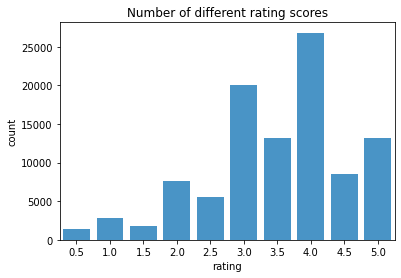

In [ ]:
print("Total number of ratings: %i" % ratings_df.count())
# plot count of different rating scores
sns.barplot(x = 'rating', y = 'count', color = '#3498db', data = ratings_df.groupBy('rating').count().toPandas()).set_title('Number of different rating scores')

print("The most 5 movies people watched:")
ratings_df.groupBy('movieId').count().join(movies_df1,['movieId'],'left').orderBy('count', ascending=False).show(5)
'''
we found out movie with id 356 is the most popular movie with 100836 reviews.
'''
data0 = ratings_df.groupBy('movieId').count()
print("The number of movies with only one rating: %i" % data0[data0['count'] == 1].select('movieId').count())


### 7 Tag in the tags dataset
Although I haven't used those tags yet in the current recommendation system, it is still interesting to explore them.

#### 7.1 The Number of distinct tags in the database

In [ ]:
num_tags = tags_df.select("tag").distinct().count()
print(num_tags)

1589


#### 7.2 Display the most used tags

In [ ]:
tags_df.groupBy('tag').count().orderBy('count',ascending = False).show()

+------------------+-----+
|               tag|count|
+------------------+-----+
|  In Netflix queue|  131|
|       atmospheric|   36|
|         superhero|   24|
| thought-provoking|   24|
|            Disney|   23|
|           surreal|   23|
|             funny|   23|
|          religion|   22|
|        psychology|   21|
|       dark comedy|   21|
|            quirky|   21|
|            sci-fi|   21|
|          suspense|   20|
|      twist ending|   19|
|visually appealing|   19|
|             crime|   19|
|          politics|   18|
|             music|   16|
|       time travel|   16|
|    mental illness|   16|
+------------------+-----+
only showing top 20 rows



In [ ]:
!pip install wordcloud

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

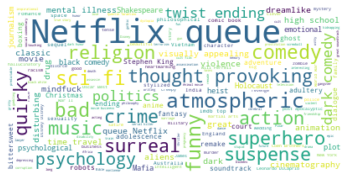

In [ ]:
text = tags_df.select('tag').rdd.map(lambda row : row[0]).collect()
wordcloud = WordCloud(background_color = 'white').generate(' '.join(text))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis("off")
plt.show()

### 8 Display movie posters using TMDb API for future use

In [ ]:
# add tmdbId column to movies dataframe
movies_df2 = movies_df1.join(links_df,['movieId'],'left')
movies_df2.show(2)

+-------+----------+------------+--------------------+------+------+
|movieId|     title|release_year|              genres|imdbId|tmdbId|
+-------+----------+------------+--------------------+------+------+
|      1|Toy Story |        1995|Adventure|Animati...|114709|   862|
|      2|  Jumanji |        1995|Adventure|Childre...|113497|  8844|
+-------+----------+------------+--------------------+------+------+
only showing top 2 rows



In [ ]:
!pip install tmdbsimple

In [ ]:
import tmdbsimple as tmdb
from IPython.display import Image, HTML, display

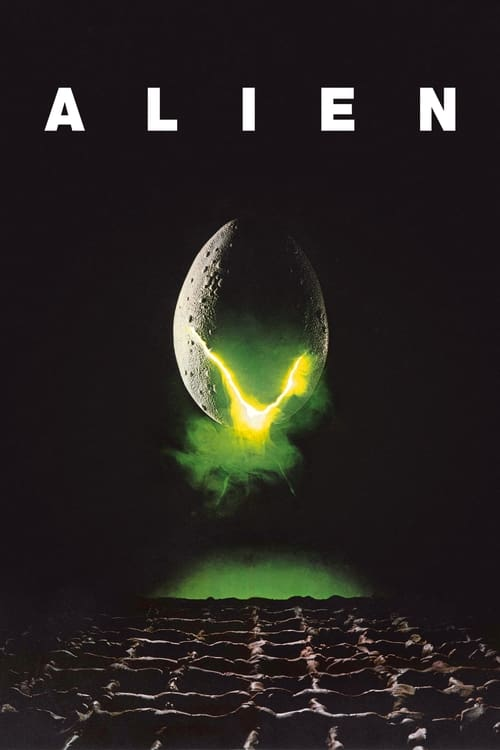

In [ ]:
try:
    # replace this variable with your actual TMdb API key
    tmdb.API_KEY = 'efeae3bdaa6740ca89f10c7ae4cf5db4'
    # print("Successfully imported tmdbsimple!")
    # base URL for TMDB poster images
    IMAGE_URL = 'https://image.tmdb.org/t/p/w500'
    # movie_id = movies_df2.first().tmdbId
    movie_id = movies_df2[movies_df2.movieId == 1214].collect()[0][-1]
    movie_info = tmdb.Movies(movie_id).info()
    movie_poster_url = IMAGE_URL + movie_info['poster_path']
    display(Image(movie_poster_url, width=200))
    # print(movie_poster_url)
except Exception:
    # print("Cannot import tmdbsimple, no movie posters will be displayed!")
    display(Image('https://www.prokerala.com/movies/assets/img/no-poster-available.jpg', width=200))


# Part 2: Spark ALS based approach for training model
In this part, I built the ALS model and tuned the hyperparameters by using 5-fold Cross Validation with the Grid Search method on the training set, and evaluated the performance of the best model on the test data by computing RMSE of model inference. I trained the ALS model with the best parameters found by CV from the last step.

#### Data Processing

In [ ]:
ratings_df.show()

+------+-------+------+---------+
|userId|movieId|rating|timestamp|
+------+-------+------+---------+
|     1|      1|   4.0|964982703|
|     1|      3|   4.0|964981247|
|     1|      6|   4.0|964982224|
|     1|     47|   5.0|964983815|
|     1|     50|   5.0|964982931|
|     1|     70|   3.0|964982400|
|     1|    101|   5.0|964980868|
|     1|    110|   4.0|964982176|
|     1|    151|   5.0|964984041|
|     1|    157|   5.0|964984100|
|     1|    163|   5.0|964983650|
|     1|    216|   5.0|964981208|
|     1|    223|   3.0|964980985|
|     1|    231|   5.0|964981179|
|     1|    235|   4.0|964980908|
|     1|    260|   5.0|964981680|
|     1|    296|   3.0|964982967|
|     1|    316|   3.0|964982310|
|     1|    333|   5.0|964981179|
|     1|    349|   4.0|964982563|
+------+-------+------+---------+
only showing top 20 rows



In [ ]:
ratings_df.printSchema()

root
 |-- userId: integer (nullable = true)
 |-- movieId: integer (nullable = true)
 |-- rating: double (nullable = true)
 |-- timestamp: integer (nullable = true)



In [ ]:
movie_ratings = ratings_df.drop('timestamp')

In [ ]:
movie_ratings.printSchema()

root
 |-- userId: integer (nullable = true)
 |-- movieId: integer (nullable = true)
 |-- rating: double (nullable = true)



In [ ]:
# Data type convert
# from pyspark.sql.types import IntegerType, FloatType
# movie_ratings = movie_ratings.withColumn('userId',movie_ratings['userId'].cast("Integer"))
# movie_ratings = movie_ratings.withColumn('movieId',movie_ratings['movieId'].cast("Integer"))
# movie_ratings = movie_ratings.withColumn("rating", movie_ratings["rating"].cast("Float"))
# movie_ratings = ratings_df.select(ratings_df.userId.cast("integer"),ratings_df.movieId.cast("integer"),ratings_df.rating.cast("double"))
# movie_ratings.printSchema()

In [ ]:
movie_ratings.show()

+------+-------+------+
|userId|movieId|rating|
+------+-------+------+
|     1|      1|   4.0|
|     1|      3|   4.0|
|     1|      6|   4.0|
|     1|     47|   5.0|
|     1|     50|   5.0|
|     1|     70|   3.0|
|     1|    101|   5.0|
|     1|    110|   4.0|
|     1|    151|   5.0|
|     1|    157|   5.0|
|     1|    163|   5.0|
|     1|    216|   5.0|
|     1|    223|   3.0|
|     1|    231|   5.0|
|     1|    235|   4.0|
|     1|    260|   5.0|
|     1|    296|   3.0|
|     1|    316|   3.0|
|     1|    333|   5.0|
|     1|    349|   4.0|
+------+-------+------+
only showing top 20 rows



#### ALS Model Selection and Evaluation
With the ALS model, we can use a grid search to find the optimal hyperparameters.

In [ ]:
# import package
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.recommendation import ALS, ALSModel
from pyspark.ml.tuning import CrossValidator,ParamGridBuilder

In [ ]:
# Create test and train set
(training,test) = movie_ratings.randomSplit([0.8,0.2])

In [ ]:
# Build the recommendation model using ALS on the training data
als = ALS(maxIter=5, rank=10, regParam=0.01, userCol="userId", itemCol="movieId", ratingCol="rating",
          coldStartStrategy="drop")

In [ ]:
# Tune model using ParamGridBuilder
# param_grid = ParamGridBuilder().addGrid(als.rank,[10,50,100,150])\
#                  .addGrid(als.maxIter,[5,50,100,200])\
#                  .addGrid(als.regParam,[0.01,0.05,0.1,0.15])\
#                  .build()
param_grid = ParamGridBuilder()\
             .addGrid(als.regParam, [0.01,0.05,0.1,0.15])\
             .addGrid(als.rank, [5, 10, 15])\
             .addGrid(als.maxIter, [1, 5, 10])\
             .build()

In [ ]:
# Define evaluator as RMSE
evaluator = RegressionEvaluator(metricName="rmse", labelCol="rating", predictionCol="prediction")

In [ ]:
# Build cross validation using CrossValidator
cv = CrossValidator(estimator=als, estimatorParamMaps=param_grid,evaluator=evaluator,numFolds=5)

In [ ]:
# Fit ALS model to training data
model = cv.fit(training)

In [ ]:
# Extract best model from the tuning exercise using ParamGridBuilder
best_model = model.bestModel

In [ ]:
best_model.save('/content/ml-latest-small/trained_model')

In [ ]:
# best_model = ALSModel.load('/content/ml-latest-small/trained_model')

In [ ]:
# # Number of ratings in matrix
# numerator = ratings_df.count()
# # Distinct users and movies
# users = ratings_df.select("userId").distinct().count()
# movies = ratings_df.select("movieId").distinct().count()
# # Number of ratings matrix could contain if no empty cells
# denominator = users * movies
# #Calculating sparsity
# sparsity = 1 - (numerator*1.0 / denominator)
# print ("Sparsity: "), sparsity

#### Model testing
Finally, make predictions and check the testing errors

In [ ]:
# Generate predictions and evaluate using RMSE
predictions = best_model.transform(test)
RMSE = evaluator.evaluate(predictions)

In [ ]:
# Print evaluation metrics and model parameters
print("RMSE = "+str(RMSE))
print("**Best Model**")
print("Rank:", best_model.rank)
print("MaxIter:", best_model._java_obj.parent().getMaxIter())
print("RegParam:", best_model._java_obj.parent().getRegParam())
best_rank = best_model.rank
best_maxIter = best_model._java_obj.parent().getMaxIter()
best_regParam = best_model._java_obj.parent().getRegParam()

RMSE = 0.8619862020719087
**Best Model**
Rank: 5
MaxIter: 10
RegParam: 0.15


In [ ]:
predictions.show()

+------+-------+------+----------+
|userId|movieId|rating|prediction|
+------+-------+------+----------+
|   597|    471|   2.0| 4.3042808|
|   436|    471|   3.0| 3.7184663|
|   409|    471|   3.0|  4.187469|
|   474|    471|   3.0|  3.637741|
|   500|    471|   1.0| 3.0045354|
|    57|    471|   3.0| 3.6520061|
|   555|    471|   3.0|  3.829466|
|   176|    471|   5.0|  3.556083|
|   520|    471|   5.0| 3.7378757|
|   273|    471|   5.0|  4.277588|
|   448|    471|   4.0| 3.6853826|
|   541|    471|   3.0| 3.4887502|
|   260|    471|   4.5| 3.3176847|
|    44|    833|   2.0| 2.9845974|
|   599|    833|   1.5| 1.7565304|
|   307|    833|   1.0|0.94942796|
|   474|   1088|   3.5| 2.9731205|
|    20|   1088|   4.5| 3.2653284|
|   489|   1088|   4.5|  2.658003|
|   286|   1088|   3.5|  3.244638|
+------+-------+------+----------+
only showing top 20 rows



#### Model apply and see the performance

In [ ]:
alldata = best_model.transform(movie_ratings)
RMSE = evaluator.evaluate(alldata)
print("RMSE = "+str(RMSE))

RMSE = 0.7191801515279049


We can see how we got a more accurate recommender when using a much larger dataset.

In [ ]:
alldata.registerTempTable("alldata_table")
spark.sql("SELECT * FROM alldata_table").show()

+------+-------+------+----------+
|userId|movieId|rating|prediction|
+------+-------+------+----------+
|   191|    148|   5.0| 4.8663106|
|   133|    471|   4.0| 3.0939524|
|   597|    471|   2.0| 4.3042808|
|   385|    471|   4.0| 3.2631829|
|   436|    471|   3.0| 3.7184663|
|   602|    471|   4.0| 3.4588335|
|    91|    471|   1.0| 2.6112583|
|   409|    471|   3.0|  4.187469|
|   372|    471|   3.0| 3.1868238|
|   599|    471|   2.5| 2.7523308|
|   603|    471|   4.0|  3.535855|
|   182|    471|   4.5| 3.8975332|
|   218|    471|   4.0| 3.3455255|
|   474|    471|   3.0|  3.637741|
|   500|    471|   1.0| 3.0045354|
|    57|    471|   3.0| 3.6520061|
|   462|    471|   2.5|  3.262691|
|   387|    471|   3.0| 3.2505863|
|   610|    471|   4.0| 3.4194129|
|   217|    471|   2.0|  2.990586|
+------+-------+------+----------+
only showing top 20 rows



In [ ]:
spark.sql("SELECT * \
           FROM movies\
           JOIN alldata_table ON movies.movieId = alldata_table.movieId").show()

+-------+--------------------+------------+------+------+-------+------+----------+
|movieId|               title|release_year|genres|userId|movieId|rating|prediction|
+-------+--------------------+------------+------+------+-------+------+----------+
|    148|An Awfully Big Ad...|        1995| Drama|   191|    148|   5.0| 4.8663106|
|    471| The Hudsucker Proxy|        1994|Comedy|   133|    471|   4.0| 3.0939524|
|    471| The Hudsucker Proxy|        1994|Comedy|   597|    471|   2.0| 4.3042808|
|    471| The Hudsucker Proxy|        1994|Comedy|   385|    471|   4.0| 3.2631829|
|    471| The Hudsucker Proxy|        1994|Comedy|   436|    471|   3.0| 3.7184663|
|    471| The Hudsucker Proxy|        1994|Comedy|   602|    471|   4.0| 3.4588335|
|    471| The Hudsucker Proxy|        1994|Comedy|    91|    471|   1.0| 2.6112583|
|    471| The Hudsucker Proxy|        1994|Comedy|   409|    471|   3.0|  4.187469|
|    471| The Hudsucker Proxy|        1994|Comedy|   372|    471|   3.0| 3.1

# Part 3: Give recommendations based on the recommendation system
In this part, a class MovieRecommendationSystem is represented. For given users, I wrote a function to recommend several movies which they may be interested in based on the model. I also applied the results from ALS and defined similarity metrics on finding the most similar moives for a given movie. I included two common metrics to evaluate the similarity between movies: cosine similarity and euclidean distance, which can be chosen based on situations.

In [ ]:
# import package
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.recommendation import ALS, ALSModel
from pyspark.ml.tuning import CrossValidator,ParamGridBuilder
from pyspark.sql.functions import col, explode
import tmdbsimple as tmdb
from IPython.display import Image, HTML, display
from skimage import io
import cv2

class MovieRecommendationSystem:

  '''
  A movie recommendation system
  '''

  def __init__(self, movie_ratings, movies_df, model = None):

    '''
    Init the recommendation system given a movie rating dataset, movies dataset, and model is optional
    '''
    self.movie_ratings = movie_ratings
    self.movies_df = movies_df
    self.model = model


  def fit_ALS(self, maxIter = 10, rank = 15, regParam = 0.15, evaluate = True, save = True, save_name = 'new_model', save_path='/content/'):

    '''
    Fit ALS model
    maxIter, rank, regParam: best parameters from cross validation on sample dataset
    evaluate: if True, evaluate model by computing RMSE
    save: if True, save model
    out: the trained model for recommendation
    '''

    print("Training ALS model with the current movie ratings data...")
    training_data, test_data = self.movie_ratings.randomSplit([0.8, 0.2])
    als = ALS(maxIter=maxIter, rank=rank, regParam=regParam, userCol="userId", itemCol="movieId", ratingCol="rating", coldStartStrategy="drop")
    self.model = als.fit(training_data)
    print('Done!')

    if evaluate:
      # Define evaluator as RMSE
      print("Evaluate model: computing RMSE on test data...")
      evaluator = RegressionEvaluator(metricName="rmse", labelCol="rating", predictionCol="prediction")
      predictions = self.model.transform(test_data)
      RMSE = evaluator.evaluate(predictions)
      print("RMSE = "+str(RMSE))

    if save:
      # save model
      print("Saving model...")
      self.model.save(save_path + save_name)
      print('Done!')
    return self.model


  def user_recommendation(self, user_id, k):

    '''
    Recommend the top unrated movies for a given user
    user_id: the user's id
    k: the number of movies that are recommended to user
    '''

    # Recommend k movies for each users
    user_recs = self.model.recommendForAllUsers(k+5)
    user_rec = user_recs.where(user_recs.userId == user_id)
    if user_rec.rdd.isEmpty():
      print("There's no user with id "+str(user_id)+" in the dataset.")
      return None

    # The prediciton table includes predictions for movies that have been already been watched, so before recommend movies,
    # we need to filter out those movies that have already been seen, then we need to choose rating = 'null'
    user_rec1 = user_rec.withColumn('rec_exp',explode('recommendations')).select('userId', col("rec_exp.movieId"), col("rec_exp.rating"))\
                        .join(self.movie_ratings,['userId','movieId'],'left').filter(self.movie_ratings.rating.isNull()).drop(self.movie_ratings.rating).limit(k)
    # Look at the movies recommended to userid
    print("Top %s recommended movies for user %s: " % (k, user_id))
    # print("User "+ str(user_id)+"'s Recommendations:")
    user_rec1 = user_rec1.join(self.movies_df,['movieId'],'left').orderBy(user_rec1.rating, ascending=False).drop(user_rec1.userId)
    return user_rec1


  def cosine_similarity(self, df, arr):

    '''
    Cosine similarity, the larger the cosine value, the more similar the movies
    f: spark dataframe, movie factor matrix
    arr: the movie's factor
    '''

    out = df.rdd.map(lambda x: (x[0], float(np.dot(arr,x[1])/(np.linalg.norm(arr) * np.linalg.norm(x[1])))))
    return out


  def euclidean_distance(self, df, arr):

    '''
    Euclidean distance based similarity, the smaller the distance, the more similar the movies
    f: spark dataframe, movie factor matrix
    arr: the movie's factors
    '''

    out = df.rdd.map(lambda x: (x[0], float(np.linalg.norm(np.array(arr)-np.array(x[1])))))
    return out


  def similar_movie(self, movie_id, num, method = 'cosine_similarity'):

    '''
    Find the most similar movies for a particular movie
    movie_id: the movie's id
    num: the number of similar movies that are recommended
    method: default is 'cosine_similarity', another option is 'euclidean_distance'
    '''

    movie_features = self.model.itemFactors
    if movie_features.where(movie_features.id == movie_id).rdd.isEmpty():
      print("There's no user with id " + str(movie_id) + " in the dataset.")
      return None
    movie_title = self.movies_df[self.movies_df.movieId == movie_id].collect()[0][1]
    feature = movie_features.where(movie_features.id == movie_id).collect()[0][1]
    methods = {'cosine_similarity': self.cosine_similarity, 'euclidean_distance': self.euclidean_distance}
    movie_similar_scores = methods[method](movie_features, feature).toDF(['movieId',method])
    movie_similar_scores = movie_similar_scores.orderBy(movie_similar_scores[1],ascending = (method == 'euclidean_distance')).collect()[1:num+1]
    movie_similar_scores = spark.createDataFrame(movie_similar_scores)
    movie_similar_scores = movie_similar_scores.join(self.movies_df, ['movieId'],'left').orderBy(movie_similar_scores[1], ascending = (method == 'euclidean_distance'))#.show()
    print("Top %s similar movie(s) for %s" % (num, movie_title))
    return movie_similar_scores


  def get_poster_url(self, movie_id):

    '''
    Fetch movie poster image URL from TMDb API
    movie_id: the movie's id
    '''

    try:
      # replace this variable with your actual TMdb API key
      tmdb.API_KEY = 'efeae3bdaa6740ca89f10c7ae4cf5db4'
      # print("Successfully imported tmdbsimple!")
      # base URL for TMDB poster images
      IMAGE_URL = 'https://image.tmdb.org/t/p/w500'
      # movie_id = self.movies_df.first().tmdbId
      movie_id1 = self.movies_df[self.movies_df.movieId == movie_id].collect()[0][-1]
      movie_info = tmdb.Movies(movie_id1).info()
      movie_poster_url = IMAGE_URL + movie_info['poster_path']
      # display(Image(movie_poster_url, width=200))
      return movie_poster_url
    except Exception:
      # print("Cannot import tmdbsimple, no movie posters will be displayed!")
      # display(Image('https://www.prokerala.com/movies/assets/img/no-poster-available.jpg', width=200))
      return 'https://www.prokerala.com/movies/assets/img/no-poster-available.jpg'


  def display_poster(self, df, cols = 5):

    '''
    Display the posters of recommended movies
    df: dataframe (recommended movies for users or similar movies)
    cols: the number of posters shown in one line, defalut is 5
    '''

    if df:
      display(df.toPandas())
      movie_poster_url_list = [self.get_poster_url(file[0]) for file in df.collect()]
      movie_names = [file[2] for file in df.collect()]
      images = [cv2.cvtColor(io.imread(url), cv2.COLOR_RGB2BGR) for url in movie_poster_url_list]
      # cols = 5
      rows = len(images) // cols + 1
      plt.figure(figsize=(6 * cols, 12 * len(images) // cols))
      i = 1
      for image, title in zip(images, movie_names):
          plt.subplot(rows, cols, i)
          plt.imshow(image,aspect="auto")
          plt.title(title, fontsize=15)
          plt.axis('off')
          i += 1
    else:
      return None


## Part 3.1: Recommend moives to users with id: 256, 583, and 917.
you can choose some users to recommend the moives

In [ ]:
#recommend 10 movies for each users
user_recs = best_model.recommendForAllUsers(10)
user_recs.show()

+------+--------------------+
|userId|     recommendations|
+------+--------------------+
|   471|[{3379, 4.804333}...|
|   463|[{3379, 4.9063973...|
|   496|[{32582, 4.523767...|
|   148|[{33649, 4.441461...|
|   540|[{3379, 5.4226785...|
|   392|[{3379, 4.8564544...|
|   243|[{131724, 5.33881...|
|    31|[{3379, 5.1879835...|
|   516|[{4429, 4.7287893...|
|   580|[{84847, 4.834823...|
|   251|[{3379, 5.734958}...|
|   451|[{3379, 5.12497},...|
|    85|[{7700, 5.081645}...|
|   137|[{3379, 4.9764514...|
|    65|[{3379, 4.831534}...|
|   458|[{1727, 5.0915956...|
|   481|[{720, 4.154659},...|
|    53|[{3379, 6.8255725...|
|   255|[{1194, 4.379618}...|
|   588|[{3379, 4.694506}...|
+------+--------------------+
only showing top 20 rows



In [ ]:
user_recs.registerTempTable("ALS_recs_temp")
spark.sql('SELECT userId, EXPLODE(recommendations) AS MovieRec\
     FROM ALS_recs_temp').show()

+------+-------------------+
|userId|           MovieRec|
+------+-------------------+
|   471|   {3379, 4.804333}|
|   471|  {89904, 4.613351}|
|   471|  {6201, 4.5424743}|
|   471|  {4495, 4.5424743}|
|   471|   {123, 4.5111427}|
|   471|   {7025, 4.475145}|
|   471|  {6818, 4.4521446}|
|   471| {33649, 4.4414334}|
|   471|{132333, 4.4272447}|
|   471|  {5490, 4.4272447}|
|   463|  {3379, 4.9063973}|
|   463|  {33649, 4.855007}|
|   463| {78836, 4.6833158}|
|   463|  {59018, 4.673144}|
|   463|  {60943, 4.673144}|
|   463|   {7841, 4.673144}|
|   463|  {7071, 4.6486263}|
|   463|{134796, 4.6486263}|
|   463| {26073, 4.6486263}|
|   463|{117531, 4.6486263}|
+------+-------------------+
only showing top 20 rows



In [ ]:
model0 = MovieRecommendationSystem(movie_ratings, movies_df2, best_model)

##### Find recommend movies for userid = 256

Top 10 recommended movies for user 256: 


,movieId,rating,title,release_year,genres,imdbId,tmdbId
0,104875,5.931405,The History of Future Folk,2012,Adventure|Comedy|Musical|Sci-Fi,2245195,115199
1,32892,5.592799,Ivan's Childhood (a.k.a. My Name is Ivan) (Iva...,1962,Drama|War,56111,31442
2,67618,5.578887,Strictly Sexual,2008,Comedy|Drama|Romance,494277,13808
3,33649,5.451441,Saving Face,2004,Comedy|Drama|Romance,384504,19316
4,60943,5.355270,Frozen River,2008,Drama,978759,10183
5,59018,5.355270,The Visitor,2007,Drama|Romance,857191,12473
6,92643,5.301109,Monsieur Lazhar,2011,Children|Comedy|Drama,2011971,78480
7,3086,5.285089,Babes in Toyland,1934,Children|Comedy|Fantasy|Musical,24852,25898
8,45503,5.272666,Peaceful Warrior,2006,Drama,438315,13689
9,7071,5.202079,A Woman Under the Influence,1974,Drama,72417,29845


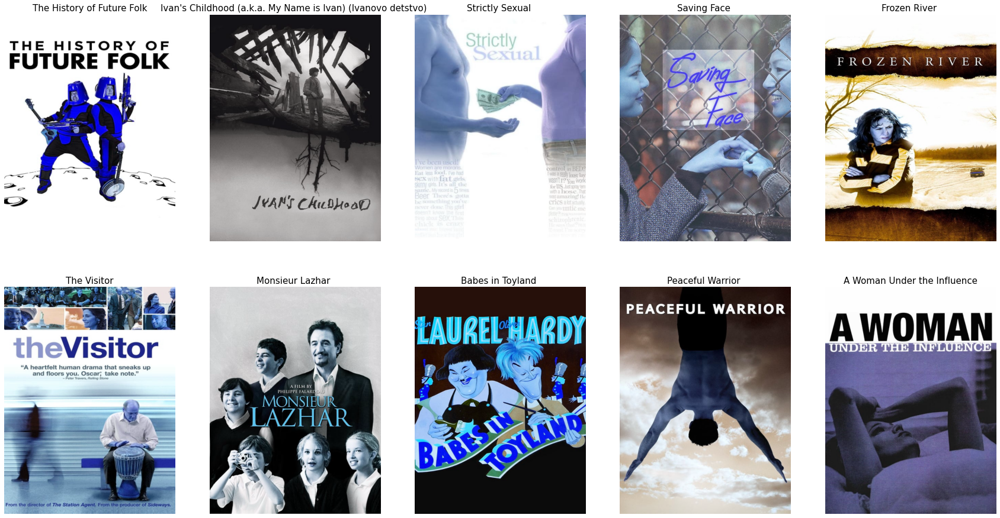

In [ ]:
model0.display_poster(model0.user_recommendation(256, 10), 5)

##### Find recommend movies for userid = 583

Top 5 recommended movies for user 583: 


,movieId,rating,title,release_year,genres,imdbId,tmdbId
0,104875,4.875861,The History of Future Folk,2012,Adventure|Comedy|Musical|Sci-Fi,2245195,115199
1,67618,4.662998,Strictly Sexual,2008,Comedy|Drama|Romance,494277,13808
2,25906,4.456072,Mr. Skeffington,1944,Drama|Romance,37094,43307
3,77846,4.456072,12 Angry Men,1997,Crime|Drama,118528,12219
4,93008,4.456072,A Very Potter Sequel,2010,Comedy|Musical,2040264,59017


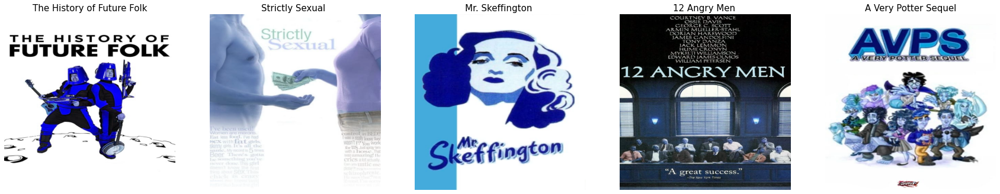

In [ ]:
model0.display_poster(model0.user_recommendation(583, 5), 5)

##### Find recommend movies for userid = 917

In [ ]:
model0.display_poster(model0.user_recommendation(917, 15), 5)

There's no user with id 917 in the dataset.


## Part 3.2: Find the similar movies for movie with id: 65, 463, 587.
You can find the similar movies based on the ALS results.

### Find the similar movies for movieid = 65

Top 10 similar movie(s) for Bio-Dome 


,movieId,cosine_similarity,title,release_year,genres,imdbId,tmdbId
0,3938,0.995664,The Slumber Party Massacre,1982,Horror,84695,27475
1,6166,0.992173,Dennis the Menace,1993,Comedy,106701,12139
2,2986,0.990943,RoboCop 2,1990,Action|Crime|Sci-Fi|Thriller,100502,5549
3,66,0.990369,Lawnmower Man 2: Beyond Cyberspace,1996,Action|Sci-Fi|Thriller,116839,11525
4,2373,0.985722,Red Sonja,1985,Action|Adventure|Fantasy,89893,9626
5,2327,0.984818,Tales from the Darkside: The Movie,1990,Fantasy|Horror|Thriller,100740,20701
6,1043,0.983749,To Gillian on Her 37th Birthday,1996,Drama|Romance,117924,30500
7,85780,0.983615,Family Guy Presents: It's a Trap,2010,Animation|Comedy|Sci-Fi,1701991,110639
8,59369,0.983295,Taken,2008,Action|Crime|Drama|Thriller,936501,8681
9,3146,0.982625,Deuce Bigalow: Male Gigolo,1999,Comedy,205000,10402


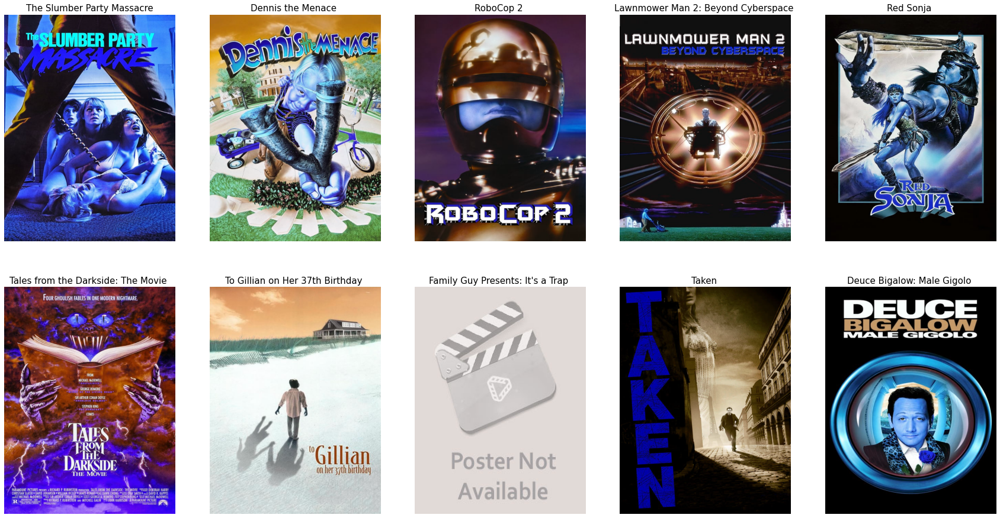

In [ ]:
model0.display_poster(model0.similar_movie(65, 10, 'cosine_similarity'), 5)

Top 10 similar movie(s) for Bio-Dome 


,movieId,euclidean_distance,title,release_year,genres,imdbId,tmdbId
0,66,0.208996,Lawnmower Man 2: Beyond Cyberspace,1996,Action|Sci-Fi|Thriller,116839,11525
1,2373,0.274766,Red Sonja,1985,Action|Adventure|Fantasy,89893,9626
2,44,0.286002,Mortal Kombat,1995,Action|Adventure|Fantasy,113855,9312
3,3146,0.290417,Deuce Bigalow: Male Gigolo,1999,Comedy,205000,10402
4,1043,0.290565,To Gillian on Her 37th Birthday,1996,Drama|Romance,117924,30500
5,6166,0.296896,Dennis the Menace,1993,Comedy,106701,12139
6,519,0.313663,RoboCop 3,1993,Action|Crime|Drama|Sci-Fi|Thriller,107978,5550
7,2986,0.317227,RoboCop 2,1990,Action|Crime|Sci-Fi|Thriller,100502,5549
8,3938,0.321714,The Slumber Party Massacre,1982,Horror,84695,27475
9,60522,0.327518,The Machine Girl(Kataude mashin gâru),2008,Action|Comedy|Fantasy|Horror|Thriller,1050160,13964


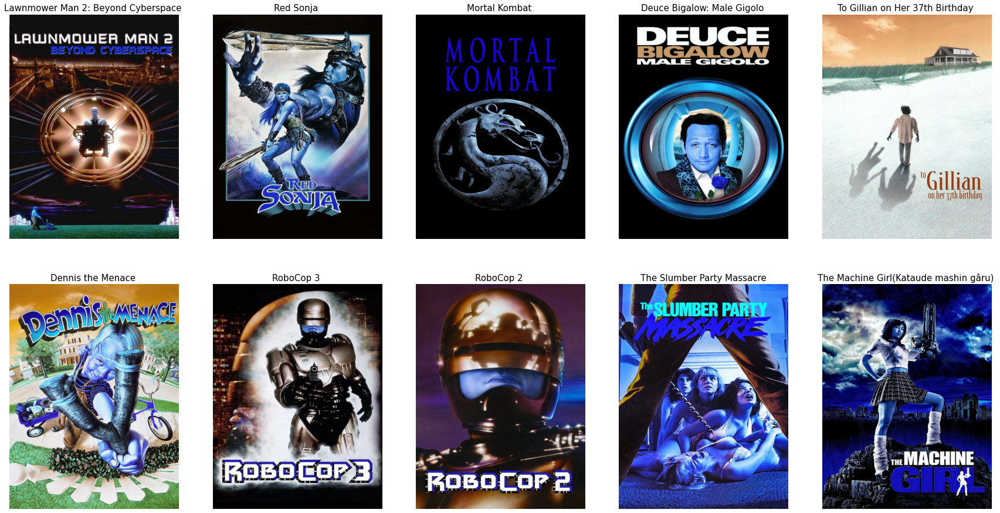

In [ ]:
model0.display_poster(model0.similar_movie(65, 10, 'euclidean_distance'), 5)

### Find the similar movies for movieid = 463

In [ ]:
model0.display_poster(model0.similar_movie(463, 10, 'euclidean_distance'), 5)

There's no user with id 463 in the dataset.


### Find the similar movies for movieid = 587

Top 15 similar movie(s) for Ghost 


,movieId,cosine_similarity,title,release_year,genres,imdbId,tmdbId
0,1010,0.999081,The Love Bug,1969,Children|Comedy,64603,14136
1,6942,0.998584,Love Actually,2003,Comedy|Drama|Romance,314331,508
2,132,0.997943,Jade,1995,Thriller,113451,11863
3,3754,0.997752,The Adventures of Rocky and Bullwinkle,2000,Adventure|Animation|Children|Comedy|Fantasy,131704,17711
4,5553,0.997149,Stakeout,1987,Comedy|Crime|Romance|Thriller,94025,10859
5,414,0.996803,The Air Up There,1994,Comedy,109067,46094
6,140,0.995640,Up Close and Personal,1996,Drama|Romance,118055,9302
7,6579,0.995563,"One, Two, Three",1961,Comedy,55256,430
8,1004,0.995553,The Glimmer Man,1996,Action|Thriller,116421,9625
9,2837,0.995549,Bedrooms & Hallways,1998,Comedy|Romance,126810,40694


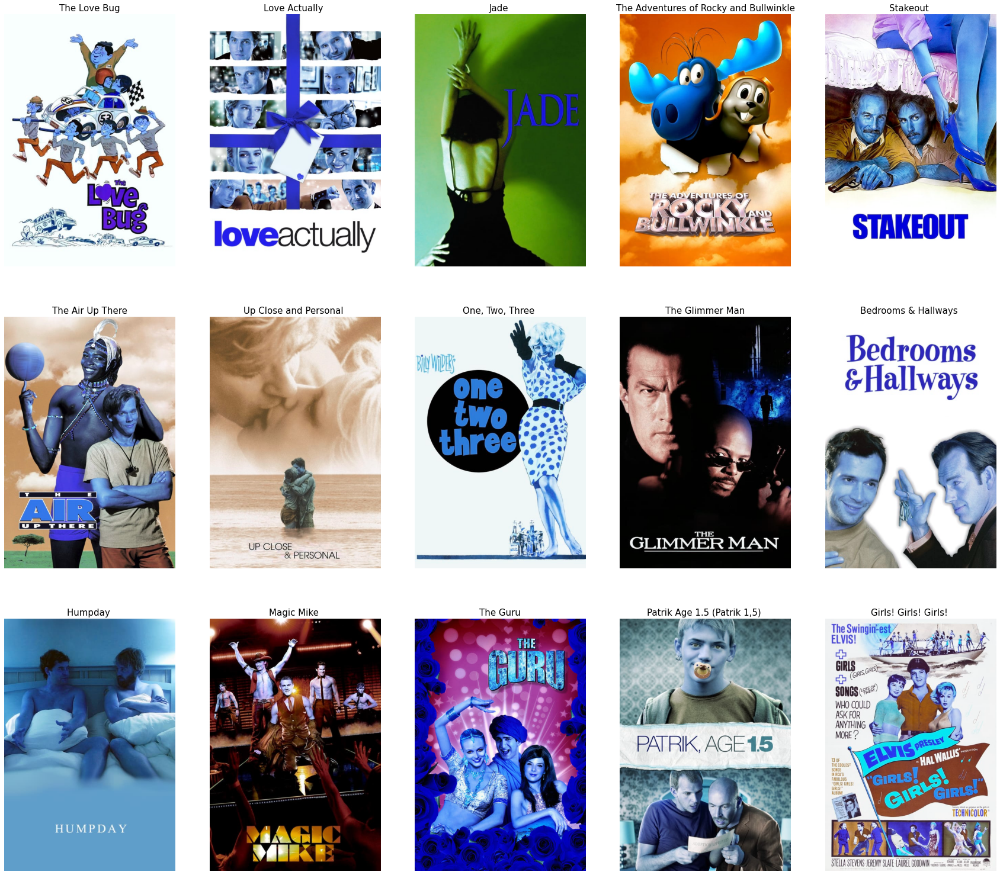

In [ ]:
model0.display_poster(model0.similar_movie(587, 15, 'cosine_similarity'), 5)

# Part 4: Add new user and recommend movies for the new user
This is very common for real-life datasets when it's being updated continuously. In this part, when using Collaborative Filtering and Spark's Alternating Least Squares, recommendation system needs to be trained every time we have new user ratings. Once we have our model trained, we can reuse it to obtain top recomendations for a given user or an individual rating for a particular movie.

In [ ]:
ratings_df.where(ratings_df.userId==1000).rdd.isEmpty()

True

In [ ]:
new_user_id = 1000
new_user_ratings = [(new_user_id, 85414, 3.5), # Source Code
                    (new_user_id, 96821, 4.5), # The Perks of Being a Wallflower
                    (new_user_id, 1537, 4), # Shall We Dance
                    (new_user_id, 1035, 4), # The Sound of Music
                    (new_user_id, 916, 3.5), # Roman Holiday
                    (new_user_id, 446, 5), # Farewell My Concubine (Ba wang bie ji)
                    (new_user_id, 364, 4), # The Lion King
                    (new_user_id, 1721, 5), # Titanic
                    (new_user_id, 2324, 4), # Life Is Beautiful (La Vita Ã¨ bella)
                    (new_user_id, 77846, 5), # 12 Angry Men
                    (new_user_id, 1207, 4.5), # To Kill a Mockingbird
                    (new_user_id, 261, 4), # Little Women
                    (new_user_id, 46062, 3.5), # High School Musical
                    (new_user_id, 61123, 3), # High School Musical 2
                    (new_user_id, 1265, 3.5), # Groundhog Day
                    (new_user_id, 4995, 4), # A Beautiful Mind
                    (new_user_id, 73290, 4.5), # Hachiko: A Dog's Story (a.k.a. Hachi: A Dog's Tale)
                    (new_user_id, 177765, 5), # Coco
                    (new_user_id, 95654, 4), # Geri's Game
                    (new_user_id, 2691, 4), # Legend of 1900, The (a.k.a. The Legend of the Pianist on the Ocean) (Leggenda del pianista sull'oceano)
                    (new_user_id, 152081, 3.5), # Zootopia
                    (new_user_id, 47099, 4.5), # The Pursuit of Happyness
                    (new_user_id, 296, 3.5), # Pulp Fiction
                    (new_user_id, 47832, 4), # Step Up
                    (new_user_id, 33669, 4), # The Sisterhood of the Traveling Pants
                    (new_user_id, 77206, 3.5), # Diary of a Wimpy Kid
                    (new_user_id, 47518, 3.5), # Accepted
                    (new_user_id, 4700, 3), # The Princess Diaries
                    (new_user_id, 1246, 4.5), # Dead Poets Society
                    (new_user_id, 72407, 3.5), # The Twilight Saga: New Moon
                    (new_user_id, 93790, 4.5), # Detachment
                    (new_user_id, 73881, 4)] # 3 Idiots
new_user_ratings_df = spark.createDataFrame(new_user_ratings,\
                                            StructType([StructField('userId', IntegerType(), True),\
                                                        StructField('movieId', IntegerType(), True),\
                                                        StructField('rating', StringType(), False)]))
new_user_ratings_df.printSchema()

root
 |-- userId: integer (nullable = true)
 |-- movieId: integer (nullable = true)
 |-- rating: string (nullable = false)



In [ ]:
new_user_ratings_df = new_user_ratings_df.withColumn("rating", new_user_ratings_df["rating"].cast("Float"))
new_user_ratings_df.printSchema()
# add them to the data we will use to train our recommendation model
new_user_ratings_df = movie_ratings.union(new_user_ratings_df)

root
 |-- userId: integer (nullable = true)
 |-- movieId: integer (nullable = true)
 |-- rating: float (nullable = true)



In [ ]:
new_model = MovieRecommendationSystem(new_user_ratings_df, movies_df2)
# train the ALS model using all the parameters we selected before
model = new_model.fit_ALS(maxIter = best_maxIter, rank = best_rank, regParam = best_regParam, evaluate = False, save = False, save_name = 'new_model', save_path='/content/')

Training ALS model with movie ratings data...
Done!


Recommendation system needs to be trained every time we have new user ratings. Once we have our model trained, we can reuse it to obtain top recomendations for a given user or an individual rating for a particular movie.

Top 15 recommended movies for user 1000: 


,movieId,rating,title,release_year,genres,imdbId,tmdbId
0,104875,5.351349,The History of Future Folk,2012,Adventure|Comedy|Musical|Sci-Fi,2245195,115199
1,6201,5.131372,Lady Jane,1986,Drama|Romance,91374,21867
2,25906,5.021258,Mr. Skeffington,1944,Drama|Romance,37094,43307
3,93008,5.021258,A Very Potter Sequel,2010,Comedy|Musical,2040264,59017
4,5490,4.977770,The Big Bus,1976,Action|Comedy,74205,19133
5,132333,4.977770,Seve,2014,Documentary|Drama,3149640,278990
6,104339,4.925060,In a World...,2013,Comedy,2294677,157360
7,8235,4.881128,Safety Last!,1923,Action|Comedy|Romance,14429,22596
8,45503,4.845116,Peaceful Warrior,2006,Drama,438315,13689
9,3096,4.833674,My Man Godfrey,1957,Comedy,50738,52470


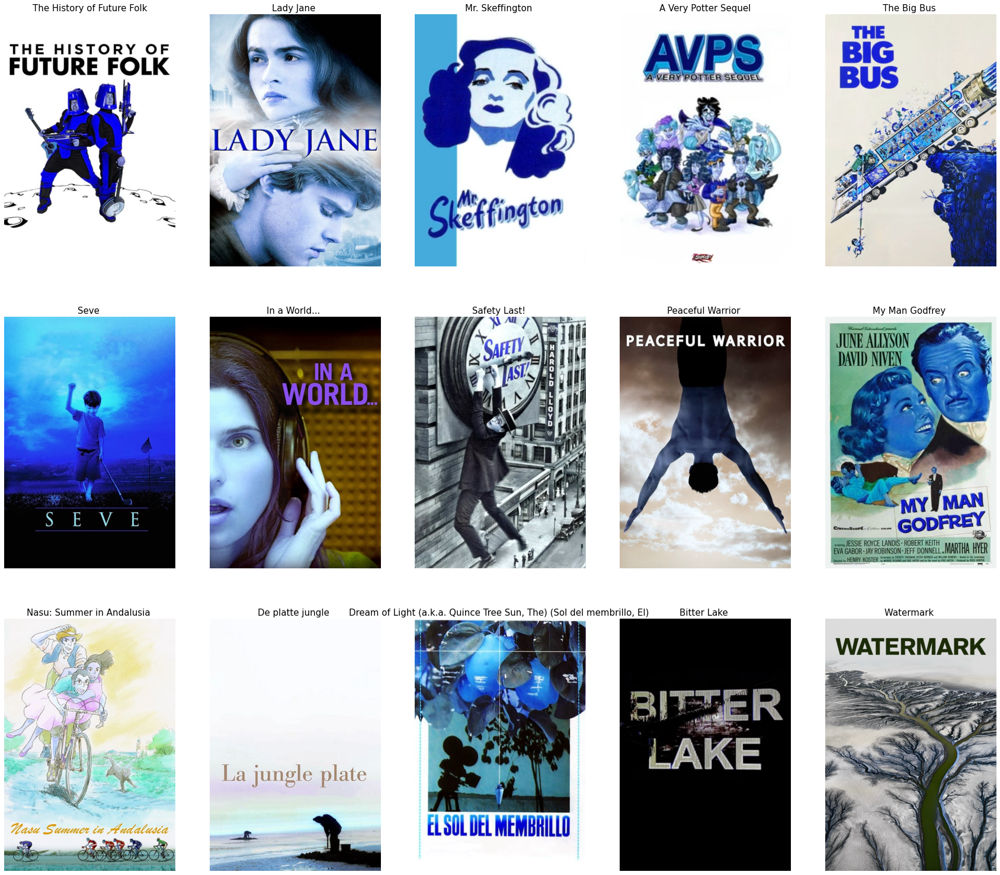

In [ ]:
new_model.display_poster(new_model.user_recommendation(1000, 15), 5)

In [ ]:
new_model.display_poster(new_model.user_recommendation(0, 5), 5)

There's no user with id 0 in the dataset.


# Conclusion

Generally, a movie profile could include attributes regarding its genre, the participating actors, its director, its language, etc. User profiles might include demographic information or answers to a suitable questionnaire. The resulting profiles allow programs to associate users with matching movies. However, content based strategies require gathering external information that might not be available or easy to collect.

An alternative strategy, our focus in this project, relies only
on past user behavior, which might be their previous reviews or the way they rate products, without requiring the creation of explicit profiles. This project is a good opportunity for us to understand how Spark was implemented in building an effective Movie Recommendation system according to the Collaborating Filtering method. The ALS model is not only able to provide recommendations, which hopefully suit users' unique taste and needs, but also able to mine latent information, which is the latent variable in matrix factorization. This latent information is helpful for us to gain some deeper insight. In this project, this information was used to measure the difference between any two movies so that we are able to find similar movies for a particular movie.